# House Sales Prediction Using Neural Network Model
For this project, we would like to create neural network model to predict house price using several attributes such as time of the home sale, location of the house and also the house features (floors etc).

#### Feature Columns
    
* id - Unique ID for each home sold
* date - Date of the home sale
* price - Price of each home sold
* bedrooms - Number of bedrooms
* bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
* sqft_living - Square footage of the apartments interior living space
* sqft_lot - Square footage of the land space
* floors - Number of floors
* waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not
* view - An index from 0 to 4 of how good the view of the property was
* condition - An index from 1 to 5 on the condition of the apartment,
* grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
* sqft_above - The square footage of the interior housing space that is above ground level
* sqft_basement - The square footage of the interior housing space that is below ground level
* yr_built - The year the house was initially built
* yr_renovated - The year of the house’s last renovation
* zipcode - What zipcode area the house is in
* lat - Lattitude
* long - Longitude
* sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
* sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('TensorFlow_FILES/DATA/kc_house_data.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  int64  
 9   view           21597 non-null  int64  
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  int64  
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   21597 non-null  int64  
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

# Exploratory Data Analysis

In [3]:
df.isnull().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [4]:
df.duplicated().sum()

0

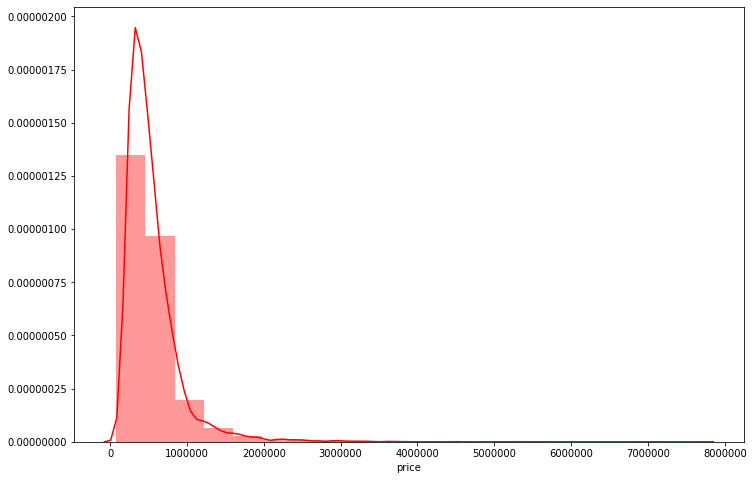

In [5]:
plt.figure(figsize=(12,8))
sns.distplot(df['price'], bins=20, color='red')

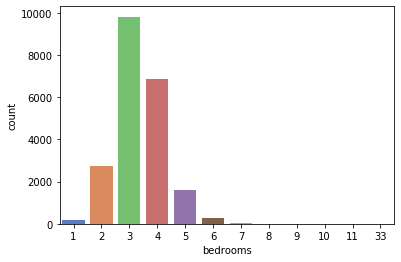

In [6]:
sns.countplot(df['bedrooms'], palette='muted', orient='h')

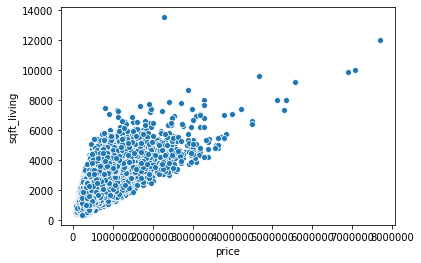

In [7]:
sns.scatterplot(x='price', y='sqft_living', data=df)

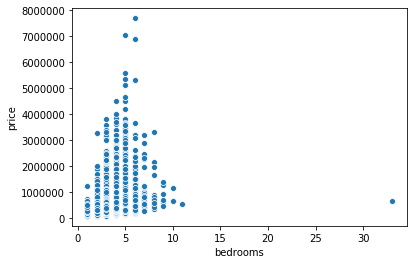

In [8]:
sns.scatterplot(y='price', x='bedrooms', data=df)

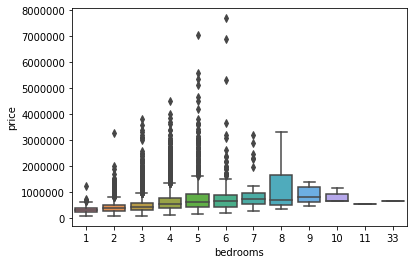

In [9]:
sns.boxplot(x='bedrooms',y='price',data=df)

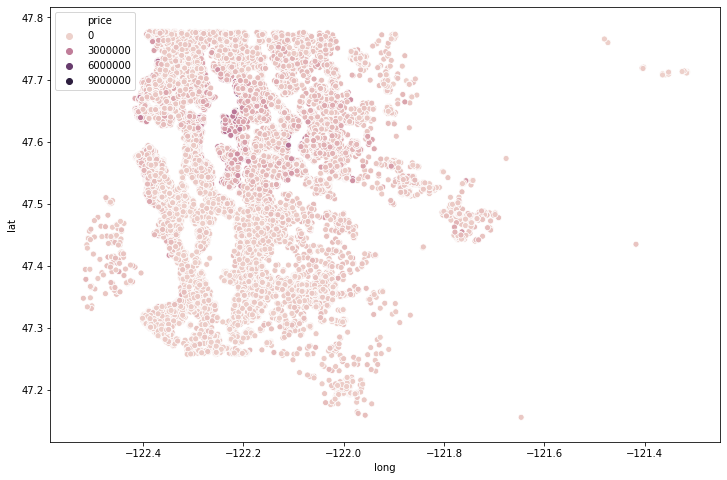

In [10]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='long',y='lat', data=df, hue='price')

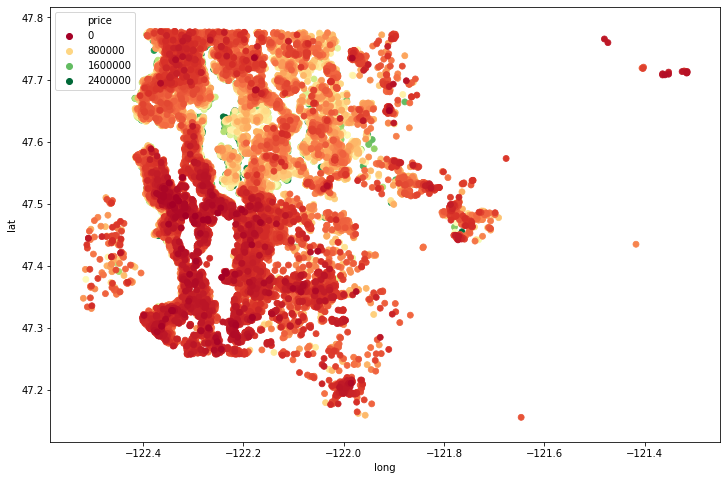

In [11]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='long',y='lat', data=df.sort_values('price',ascending=False).iloc[216:], hue='price', palette='RdYlGn',edgecolor=None)

# Feature Engineering
Let's divide the date variable to month and and year:

In [4]:
df['date'] = pd.to_datetime(df['date'])

In [5]:
df['month'] = df['date'].dt.month

In [6]:
df['year'] = df['date'].dt.year


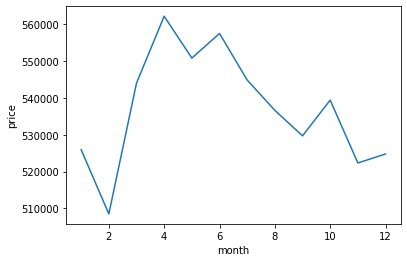

In [14]:
month = df.groupby('month').mean()['price']
sns.lineplot(x=month.index,y=month)

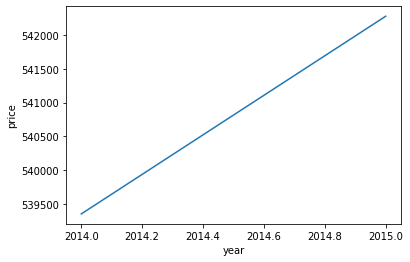

In [16]:
year = df.groupby('year').mean()['price']
sns.lineplot(x=year.index,y=year)

We could see from graph above that the price is correlate well with year. 

In [17]:
df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'month', 'year'],
      dtype='object')

Before modeling, let's drop unnecessary columns:

In [7]:
df = df.drop('id', axis=1)
df = df.drop('date', axis=1)
df = df.drop('zipcode', axis=1)

# Scaling and Train Test Split

In [8]:
X = df.drop('price', axis=1).values
y = df['price'].values

In [9]:
from sklearn.model_selection import train_test_split

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, random_state=1)

X_train, X_val, y_train, y_val = train_test_split(X_train,y_train,test_size=0.25,random_state=1)

In [11]:
from sklearn.preprocessing import MinMaxScaler

In [12]:
scaler = MinMaxScaler()

In [13]:
X_train = scaler.fit_transform(X_train)
X_val = scaler.fit_transform(X_val)

In [14]:
X_test = scaler.transform(X_test)

In [15]:
X_train.shape

(12957, 19)

In [16]:
X_val.shape

(4320, 19)

In [17]:
X_test.shape

(4320, 19)

# Model

In [18]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.optimizers import Adam

In [20]:
model = Sequential()

model.add(Dense(19, activation='relu'))
model.add(Dense(1))

model.compile(optimizer = 'adam', loss='mse')

# Training The Model

In [21]:
model.fit(x=X_train,y=y_train,
          validation_data=(X_val,y_val),
          batch_size=128,epochs=100)

Train on 12957 samples, validate on 4320 samples
Epoch 1/100
12957/12957 [==============================] - 1s 98us/sample - loss: 434691594513.2879 - val_loss: 414268751143.8222
Epoch 2/100
12957/12957 [==============================] - 0s 18us/sample - loss: 434687541005.2178 - val_loss: 414262941256.0593
Epoch 3/100
12957/12957 [==============================] - 0s 19us/sample - loss: 434680572971.0717 - val_loss: 414254002631.1111
Epoch 4/100
12957/12957 [==============================] - 0s 26us/sample - loss: 434670524170.8470 - val_loss: 414241821187.7926
Epoch 5/100
12957/12957 [==============================] - 0s 34us/sample - loss: 434657408526.5812 - val_loss: 414226496929.1852
Epoch 6/100
12288/12957 [===========================>..] - ETA: 0s - loss: 433357466282.6612957/12957 [==============================] - 0s 37us/sample - loss: 434641289814.1039 - val_loss: 414207988106.4296
Epoch 7/100
12957/12957 [==============================] - 0s 23us/sample - loss: 43462225957

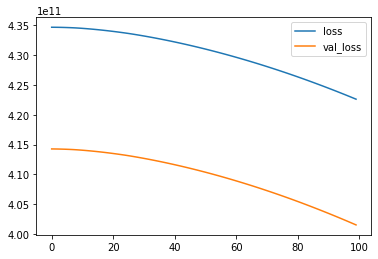

In [22]:
losses = pd.DataFrame(model.history.history)
losses.plot()

Until 100 epochs, there are no much differences on loss in both train and validation datasets. This could be caused by the low number of epochs.

In [25]:
from sklearn.metrics import mean_squared_error,mean_absolute_error,explained_variance_score

In [26]:
# Train Model
predictions_train = model.predict(X_train)
mean_absolute_error(y_train, predictions_train)

532593.0215770041

In [27]:
# Test Model
predictions_test = model.predict(X_test)
mean_absolute_error(y_test, predictions_test)

524961.4632872405

In [28]:
df['price'].mean()

540296.5735055795


The mean absolute error on test dataset is not far from the mean value of the price variables, which means that the error is very high.

Text(0.5, 1.0, 'prediction_test vs y_test')

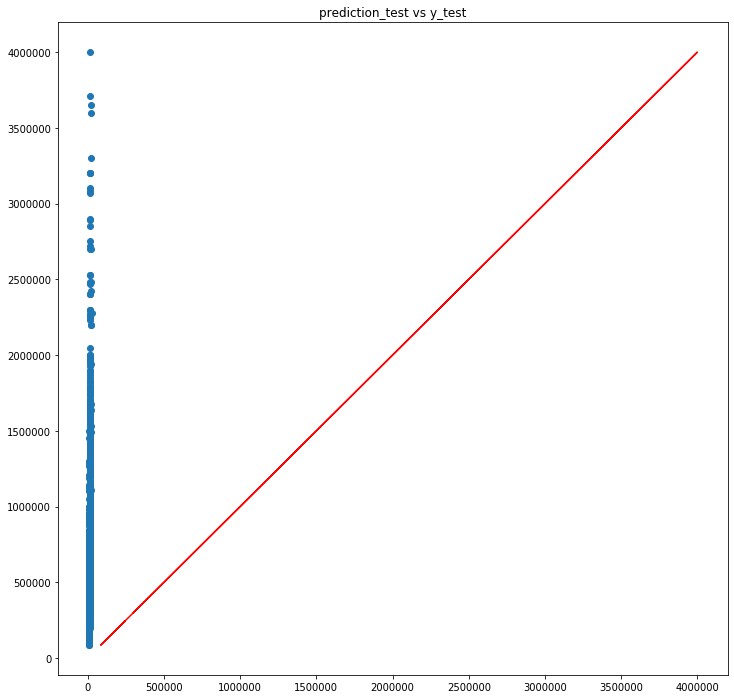

In [36]:
plt.figure(figsize=[12,12])
plt.scatter(y = y_test, x = predictions_test)
plt.plot(y_test, y_test,'r')
plt.title('prediction_test vs y_test')

Text(0.5, 1.0, 'Residual Distribution Plot')

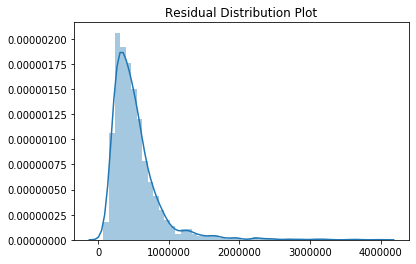

In [34]:
errors = y_test.reshape(4320, 1) - predictions_test
sns.distplot(errors)
plt.title('Residual Distribution Plot')

From the graphs above, We could see that the model perform very poorly. All of our predicted price is way off from the true price while the peak value in the residual distribution plot is also not accumulated in zero. Let's try to remodel the neural network!

# Re-train the Model
In this section, we would try to remodel by adding more layers and adding epochs size.

In [52]:
remodel = Sequential()

remodel.add(Dense(19, activation='relu'))
remodel.add(Dense(19, activation='relu'))
remodel.add(Dense(1))

remodel.compile(optimizer = 'adam', loss='mse')

In [53]:
remodel.fit(x=X_train,y=y_train,
          validation_data=(X_val,y_val),
          batch_size=128,epochs=150)

Train on 12957 samples, validate on 4320 samples
Epoch 1/150
12957/12957 [==============================] - 1s 107us/sample - loss: 434691894265.7566 - val_loss: 414269235624.7704
Epoch 2/150
12957/12957 [==============================] - 0s 23us/sample - loss: 434683806007.0646 - val_loss: 414249403460.2667
Epoch 3/150
12957/12957 [==============================] - 0s 22us/sample - loss: 434642806519.5635 - val_loss: 414176299751.3481
Epoch 4/150
12957/12957 [==============================] - 0s 22us/sample - loss: 434530661129.9776 - val_loss: 414006048388.7407
Epoch 5/150
12957/12957 [==============================] - 0s 23us/sample - loss: 434309408430.2230 - val_loss: 413707233841.3038
Epoch 6/150
12957/12957 [==============================] - 0s 26us/sample - loss: 433949906275.2427 - val_loss: 413243769560.1778
Epoch 7/150
12957/12957 [==============================] - 0s 22us/sample - loss: 433417801909.7704 - val_loss: 412588601313.6592
Epoch 8/150
12957/12957 [===============

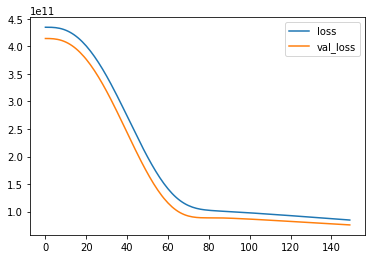

In [54]:
losses = pd.DataFrame(remodel.history.history)
losses.plot()

Different with the previous model, the loss now decrease sharply around 40 epochs. After that, our train and validation datasets loss are flattened.

In [55]:
# Train Model
predictions_remodel_train = remodel.predict(X_train)
mean_absolute_error(y_train, predictions_remodel_train)

181400.1249397044

In [56]:
# Test Model
predictions_remodel_test = remodel.predict(X_test)
mean_absolute_error(y_test, predictions_remodel_test)

192971.38712384258

Text(0.5, 1.0, 'prediction_test vs y_test')

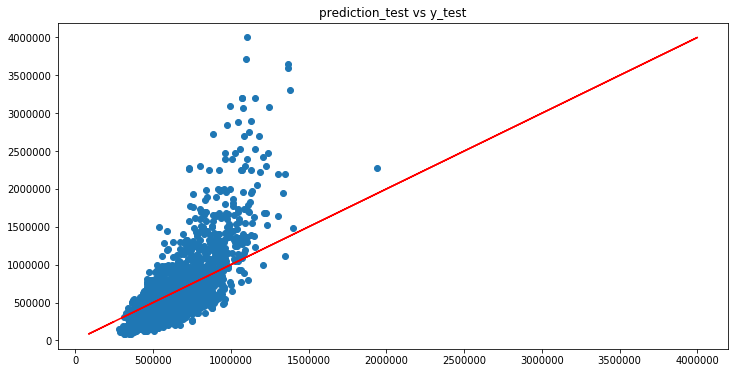

In [58]:
plt.figure(figsize=[12,6])
plt.scatter(y = y_test, x = predictions_remodel_test)
plt.plot(y_test, y_test,'r')
plt.title('prediction_test vs y_test')

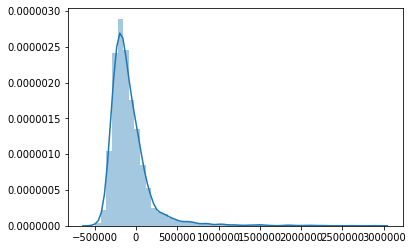

In [59]:
errors = y_test.reshape(4320, 1) - predictions_remodel_test
sns.distplot(errors)

After remodel, the mean absolute error value both on train and test dataset is decreased significantly, while on the remodel residual distribution plot, the peak is looks normal than before. In the predicted vs real price plot, the model improved significantly however the model could not predict well the price above 1,000,000. Perhaps by adding more layers in the model, we could overcome the problem.